# 0. Necessary Imports
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [ ]:
!pip install torch==2.2.0 torchvision==0.17.0 torchaudio==2.2.0 torchtext==0.17 --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 757.3/757.3 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 99.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 71.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 84.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 54.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 101.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# ADD YOUR CODE HERE
import torch
import os
import glob
import nltk
from nltk import word_tokenize
nltk.download('punkt_tab')
from torch.utils.data import Dataset,DataLoader,random_split
import cv2
from PIL import Image
from torchvision.transforms import v2
from torchvision import transforms
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import torchvision
from torch.nn import functional as F
from torch.nn.utils.rnn import pack_padded_sequence
import torch.optim.lr_scheduler as lr_scheduler
from datetime import datetime
from drive.MyDrive.img_captioning.models import Encoder, Decoder,Attention,Full_model

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


# 1. DATASET
For this assignment you will be using the [Flickr8k](https://www.kaggle.com/datasets/adityajn105/flickr8k) dataset, which contains captions/descriptions of different images.

### 1.1. Download dataset
The best way to download this dataset is through Kaggle.
First create a token, download it and upload it here. Follow these steps: https://www.kaggle.com/discussions/general/74235

In [3]:
!pip install -q kaggle

In [4]:
from google.colab import files
files.upload()

Saving kaggle (1).json to kaggle (1).json


{'kaggle (1).json': b'{"username":"nijatmmmadov","key":"d29c1b517feb35c07e28f7734941ace4"}'}

In [5]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [6]:
!kaggle datasets download -d adityajn105/flickr8k

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
 98% 1.02G/1.04G [00:06<00:00, 178MB/s]
100% 1.04G/1.04G [00:06<00:00, 165MB/s]


In [7]:
!unzip flickr8k.zip -d flickr8k

Streaming output truncated to the last 5000 lines.
  inflating: flickr8k/Images/2844846111_8c1cbfc75d.jpg  
  inflating: flickr8k/Images/2844963839_ff09cdb81f.jpg  
  inflating: flickr8k/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: flickr8k/Images/2845691057_d4ab89d889.jpg  
  inflating: flickr8k/Images/2845845721_d0bc113ff7.jpg  
  inflating: flickr8k/Images/2846037553_1a1de50709.jpg  
  inflating: flickr8k/Images/2846785268_904c5fcf9f.jpg  
  inflating: flickr8k/Images/2846843520_b0e6211478.jpg  
  inflating: flickr8k/Images/2847514745_9a35493023.jpg  
  inflating: flickr8k/Images/2847615962_c330bded6e.jpg  
  inflating: flickr8k/Images/2847859796_4d9cb0d31f.jpg  
  inflating: flickr8k/Images/2848266893_9693c66275.jpg  
  inflating: flickr8k/Images/2848571082_26454cb981.jpg  
  inflating: flickr8k/Images/2848895544_6d06210e9d.jpg  
  inflating: flickr8k/Images/2848977044_446a31d86e.jpg  
  inflating: flickr8k/Images/2849194983_2968c72832.jpg  
  inflating: flickr8k/Images/28507194

### 1.2. Load dataset
In order to load the dataset, you need to create a pytorch Dataset class.
The class should return images and captions. Remember that the captions should be returned as tokens. Do not forget to include the SOS:start of sentence, EOS:end of sentence and UNK:unknown tokens. You may want to build a vocabulary class in order to save all the words in your dataset, because your model can only predict words in your vocabulary. You do not have to save every word in your vocabulary, it is common practice to save only those words that appear multiple times in your whole dataset. For example, save only words that appear at least 5 times in your whole dataset.

In [8]:
# Open the captions.txt file from the specified path in read mode
with open('/content/flickr8k/captions.txt') as file:
    # Read all lines from the file and store them in a list
    lines = file.readlines()

# Skip the first line (usually a header) by slicing the list from the second line onwards
lines = lines[1:]

# Remove the newline character '\n' from each line using a lambda function and map it to all lines
lines = list(map(lambda x: x.replace('\n', ''), lines))

# Print the number of lines after removing the header and newline characters
print(len(lines))


40455


In [9]:
# Initialize an empty dictionary to store image-to-caption mappings
img2caps = {}

# Iterate through each line in the processed 'lines' list
for line in lines:
    # Split the line into two parts using '.jpg,' as the delimiter
    # array[0] will contain the image name, and array[1] will contain the caption
    array = line.split('.jpg,')

    # Check if the image name (with '.jpg' appended) is already a key in img2caps
    if array[0] + '.jpg' not in img2caps:
        # If the image name is not a key, initialize an empty list for this image
        img2caps[array[0] + '.jpg'] = []

    # Append the caption (array[1]) to the list associated with the image name
    img2caps[array[0] + '.jpg'].append(array[1])


In [10]:
# Iterate over the first 5 keys in the img2caps dictionary
for i in list(img2caps.keys())[:5]:
    # Print the image filename (key) and its associated captions (value list)
    # Also, print the length of the tokenized first caption using word_tokenize
    print(i, img2caps[i], ':', len(word_tokenize(img2caps[i][0])))

1000268201_693b08cb0e.jpg ['A child in a pink dress is climbing up a set of stairs in an entry way .', 'A girl going into a wooden building .', 'A little girl climbing into a wooden playhouse .', 'A little girl climbing the stairs to her playhouse .', 'A little girl in a pink dress going into a wooden cabin .'] : 18
1001773457_577c3a7d70.jpg ['A black dog and a spotted dog are fighting', 'A black dog and a tri-colored dog playing with each other on the road .', 'A black dog and a white dog with brown spots are staring at each other in the street .', 'Two dogs of different breeds looking at each other on the road .', 'Two dogs on pavement moving toward each other .'] : 9
1002674143_1b742ab4b8.jpg ['A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .', 'A little girl is sitting in front of a large painted rainbow .', 'A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .', 'There is a girl with pigtail

In [11]:
# Initialize word-to-index and index-to-word dictionaries with special tokens
word2idx = {'PAD': 0, 'SOS': 1, 'EOS': 2, 'UNK': 3}  # Maps special tokens to unique indices
idx2word = {0: 'PAD', 1: 'SOS', 2: 'EOS', 3: 'UNK'}  # Maps indices to special tokens

# Initialize an empty dictionary to store word frequencies
word_freq = {}

# Start indexing from 4 (since 0-3 are reserved for special tokens)
idx = 4

# Iterate over each image key in the img2caps dictionary
for img in img2caps.keys():
    # Iterate over each caption (sentence) associated with the current image
    for sentence in img2caps[img]:
        # Tokenize the sentence into words
        for word in word_tokenize(sentence):
            # If the word is not already in the word2idx dictionary, add it
            if word not in word2idx:
                word2idx[word] = idx        # Assign the current index to the word
                idx2word[idx] = word        # Map the index back to the word
                idx += 1                    # Increment the index for the next word

            # Initialize word frequency if the word is not already in word_freq
            if word not in word_freq:
                word_freq[word] = 0

            # Increment the word's frequency count
            word_freq[word] += 1


In [12]:
# Calculate the maximum caption length in the dataset, including <SOS> and <EOS> tokens
max_len = max([
    len(word_tokenize('SOS ' + cap + ' EOS'))  # Tokenize each caption wrapped with <SOS> and <EOS>
    for caps in list(img2caps.values())            # Iterate over the list of captions for each image
    for cap in caps                                # Iterate over each individual caption
])
max_len  # Display the maximum caption length


42

In [13]:
class FlickrDataset(Dataset):
    def __init__(self, root_dir, img2caps, transform=None, freq_threshold=5, word2idx=word2idx, MAX_LEN=max_len,
                 word_freq=word_freq):
        # Initialize the dataset with various parameters such as root directory, image-caption mapping,
        # transformations, frequency threshold for words, word-to-index mapping, max caption length,
        # and word frequencies
        super(FlickrDataset, self).__init__()
        self.img2caps = img2caps  # Mapping of image filenames to their respective captions
        self.transform = transform  # Optional transformation function (e.g., for image preprocessing)
        self.freq_threshold = freq_threshold  # Minimum frequency a word must have to be included in the vocabulary
        self.caption_per_image = 5  # Number of captions per image in the dataset
        self.word2idx = word2idx  # Word-to-index dictionary
        self.root_dir = root_dir  # Root directory containing the images
        self.MAX_LEN = MAX_LEN  # Maximum length of captions (after padding)
        self.word_freq = word_freq  # Dictionary containing the frequency of each word

    def __len__(self):
        # Return the total number of caption-image pairs in the dataset
        return len([cap for caps in list(self.img2caps.values()) for cap in caps])

    def __getitem__(self, idx):
        # Determine which image and caption to fetch based on the index
        img_idx = idx // self.caption_per_image  # Integer division to get the image index
        cap_idx = idx - img_idx * self.caption_per_image  # Remainder gives the caption index for the image

        # Get the image filename and corresponding caption
        img = list(self.img2caps.keys())[img_idx]
        caption = self.img2caps[img][cap_idx]

        # Read the image using OpenCV
        img_path = os.path.join(self.root_dir, 'Images', img)  # Full path to the image
        img_array = cv2.imread(img_path)  # Read the image
        img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)  # Convert from BGR (OpenCV default) to RGB

        # Tokenize the caption and convert it to a sequence of word indices
        # 1 is the index for <SOS>, 2 is for <EOS>, and words with frequency >= threshold are mapped to indices
        caption_vec = [1] + [word2idx[word] if self.word_freq[word] >= self.freq_threshold else 3 for word in word_tokenize(caption)] + [2]

        cap_len = len(caption_vec)  # The length of the caption (without padding)

        # Calculate padding size and pad the sequence to the maximum length (MAX_LEN)
        padding_size = self.MAX_LEN - len(caption_vec)
        padded_seq = nn.functional.pad(torch.tensor(caption_vec), (0, padding_size), value=0)  # Pad with <PAD> (0)

        # If a transform is provided (e.g., for image augmentation), apply it to the image
        if self.transform is not None:
            return self.transform(img_array), padded_seq  # Return the transformed image and the padded caption

        return img_array, padded_seq  # If no transform is applied, return the image and the padded caption


In [14]:
# Define the image transformations using `transforms.Compose`:
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor (C, H, W)
    transforms.Resize((128, 128)),  # Resize the image to 128x128 pixels
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize the image with ImageNet mean and std
])

# Create the dataset object using the `FlickrDataset` class.
# This assumes that 'img2caps' is a pre-defined dictionary mapping image filenames to their respective captions.
dataset = FlickrDataset('/content/flickr8k',  # Root directory where the images are located
                        img2caps,  # Dictionary mapping image filenames to captions
                        transform  # Apply the defined transformations to the images
)


In [15]:
# Get the total number of image-caption pairs in the dataset
len(dataset)

40455

In [16]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img.numpy().transpose((1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
    img = img * std + mean  # Apply denormalization
    img = np.clip(img, 0, 1)  # Clip values to [0, 1]
    return img

In [17]:
def show_image(img, title):
    img = denormalize(img)  # Denormalize the image
    plt.imshow(img)  # Display the image
    plt.title(title)  # Set the title
    plt.axis('on')  # Show axes
    plt.show()  # Show the plot


Example output from dataset class

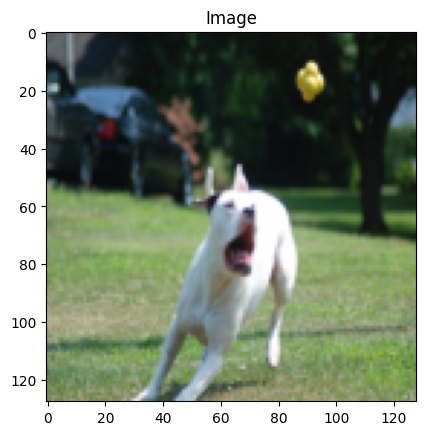

Token: tensor([  1,   4,  32, 229,  28, 230,   7, 231, 232,   6,   7, 190,  39, 233,
        234,  19,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0])
Sentence:
['SOS', 'A', 'dog', 'prepares', 'to', 'catch', 'a', 'thrown', 'object', 'in', 'a', 'field', 'with', 'nearby', 'cars', '.', 'EOS', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD', 'PAD']


In [18]:
# Show some visualizations of the created dataset
img, caps = dataset[70]  # Get image and corresponding caption (index 70)
show_image(img, "Image")  # Show the image with the title "Image"
print("Token:", caps)  # Print the tokenized caption
print("Sentence:")  # Print the original sentence
print([idx2word[token] for token in caps.tolist()])  # Convert tokens back to words using idx2word


Split your dataset into train, val and test sets

In [19]:
# Get the total length of the dataset
dataset_len = len(dataset)

# Set the split ratios for test and validation sets
test_split = 0.15
val_split = 0.15

# Calculate the sizes of the test and validation sets
test_size, val_size = int(test_split * dataset_len), int(val_split * dataset_len)

# Calculate the size of the training set
train_size = dataset_len - test_size - val_size

# Split the dataset into training, test, and validation sets
train_set, test_set, val_set = random_split(
    dataset,
    [train_size, test_size, val_size],
    torch.Generator().manual_seed(42)  # Set a seed for reproducibility
)


In [20]:
# Print the sizes of the train, test, and validation sets
print(len(train_set), len(test_set), len(val_set))

# Verify that the total length of train, test, and validation sets equals the original dataset length
print(len(train_set) + len(test_set) + len(val_set) == dataset_len)


28319 6068 6068
True


Create a dataloader, in order to load the examples in batches. Remember that, a batch has different examples, and each example (caption) may have different sizes. Therefore, consider padding techniques for the captions. For the image, use transforms in the previous step, to ensure same format and size.  

In [21]:
# Define the batch size for data loading
BATCH_SIZE = 64

# Create data loaders for the train, test, and validation sets
train_dataloader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True)  # Shuffle training data
test_dataloader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)  # No shuffle for test data
val_dataloader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)  # No shuffle for validation data


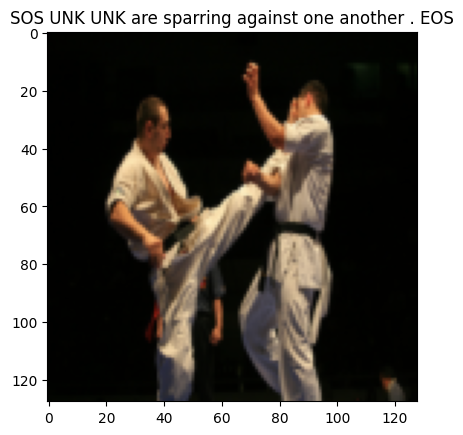

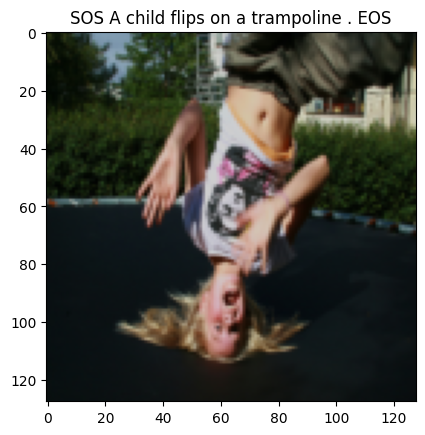

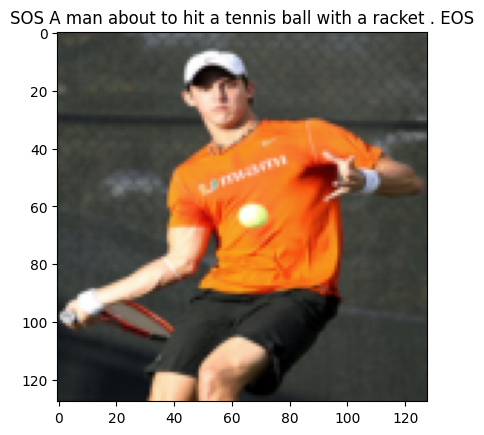

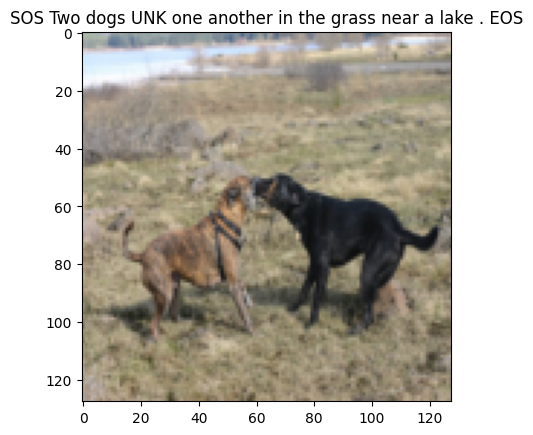

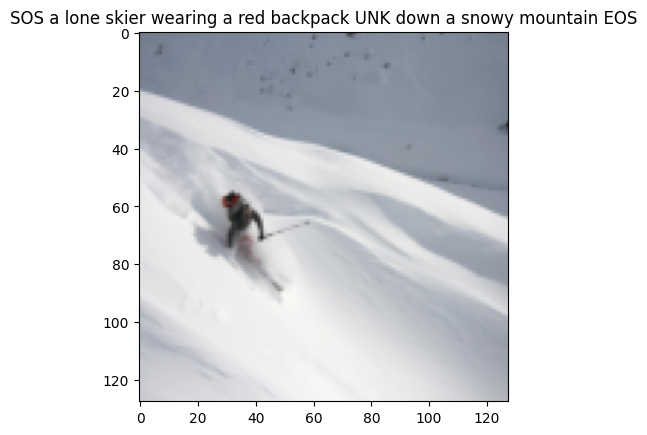

...

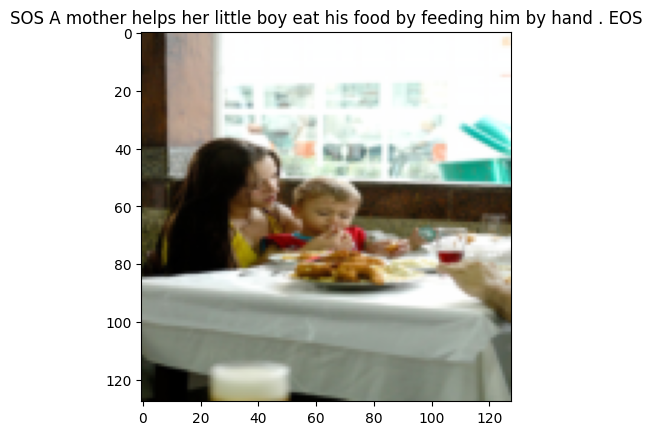

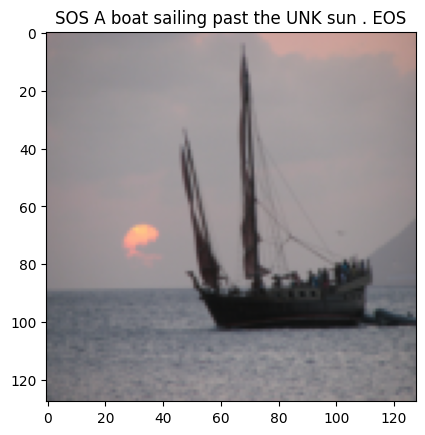

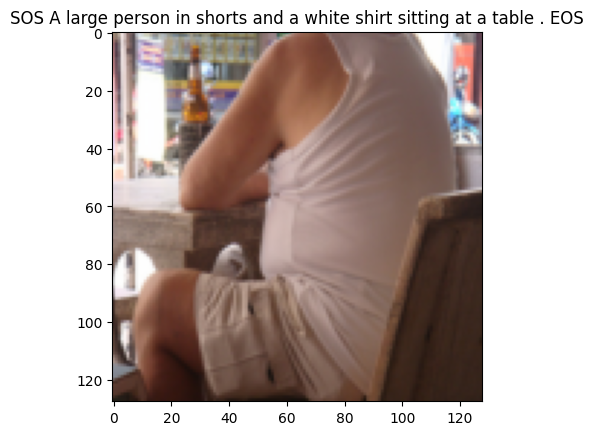

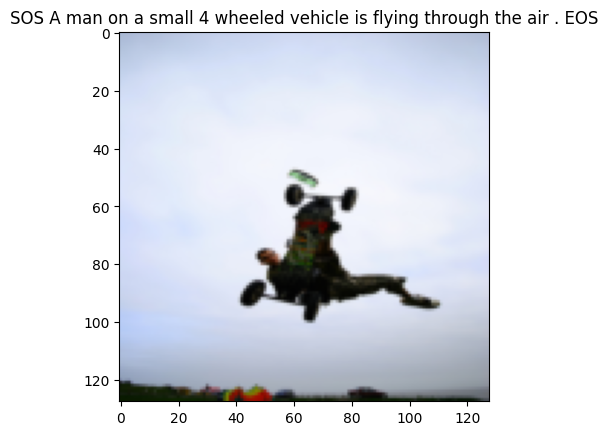

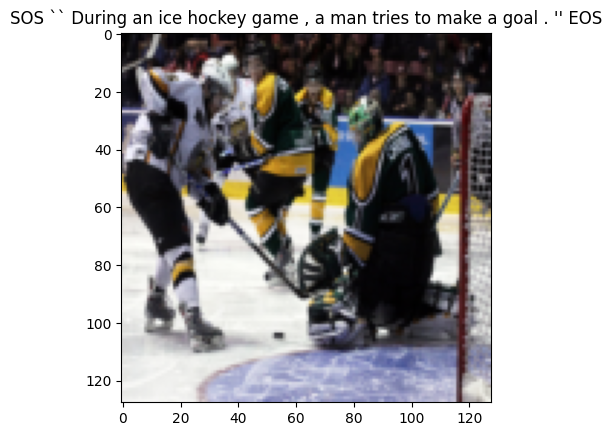

In [22]:
# Get the first batch of images and captions from the train dataloader
img, cap = next(iter(train_dataloader))

# Loop through the images and captions in the batch
for img, cap in zip(img, cap):
    # Convert tokenized caption to human-readable sentence (excluding padding tokens)
    caption_ = ' '.join([idx2word[int(i)] for i in cap if i != 0])

    # Display the image with the corresponding caption
    show_image(img, caption_)


#2. MODEL
For this assignment, you are required to create your own custom image captioning model and compare its performance with an existing pre-trained model.

In [26]:
# Set the device to GPU if available, otherwise fallback to CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Print the selected device (GPU or CPU)
device


device(type='cuda', index=0)

#### Reference
Here is an example of something similar to what we want to create:
<img src="https://drive.google.com/thumbnail?id=1wdddaLit7iEyCcVy5bS505NiYzL6c-4x&sz=w1000">


### 2.2. Training custom model

In [26]:
# ADD YOUR CODE HERE
#Example of how to save a model (call this in the training loop)
def save_model(model,num_epochs,title):
    model_state = {
        'embed_dim':embed_dim,
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }
    path = f'/content/drive/MyDrive/deep_network_development/assignment2/model/{title}.pth'
    torch.save(model_state,path)

#In case of resuming training, make sure to load the architecture first
# model = Architecture()
#and then load the weights and other params
# model.load_state_dict(model_state['state_dict'])

In [41]:
def train(train_loader, val_loader, model, criterion, optimizer, epochs):
    # Lists to store the training and validation losses for each epoch
    train_losses = []
    val_losses = []

    # Early stopping and learning rate scheduling settings
    patience = 3  # Number of epochs to wait for improvement before stopping
    scheduler1 = lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=patience)  # Reduce learning rate when validation loss plateaus
    scheduler2 = lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)  # Step learning rate every 2 epochs
    best_val_loss = float('inf')  # Initialize best validation loss to infinity
    atten_weights = []  # To store attention weights for later analysis

    for epoch in range(epochs):
        model.train()  # Set the model to training mode
        train_loss = 0  # Initialize the training loss for this epoch
        val_loss = 0  # Initialize the validation loss for this epoch

        # Loop over the training data
        for img, captions in train_loader:
            img = img.to(device)  # Move images to device (GPU/CPU)
            captions = captions.to(device)  # Move captions to device

            optimizer.zero_grad()  # Clear previous gradients

            # Get predictions, attention weights, and embeddings from the model
            preds, attention, embeds = model(img, captions)


            targets = captions[:, 1:]  # Remove the <SOS> token for targets

            # Calculate the loss
            loss = criterion(preds.view(-1, vocab_size), targets.reshape(-1))
            atten_weights.append(attention.detach())  # Detach attention weights to prevent backpropagation

            train_loss += loss.item()  # Accumulate the training loss

            loss.backward()  # Backpropagate the loss
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)  # Clip gradients to prevent exploding gradients
            optimizer.step()  # Update model parameters

        # Average training loss for this epoch
        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # Set model to evaluation mode for validation
        model.eval()
        with torch.inference_mode():  # Disable gradient calculation during inference
            for img, captions in val_loader:
                img = img.to(device)  # Move images to device
                captions = captions.to(device)  # Move captions to device

                # Get predictions from the model
                preds, alphas, embeds = model(img, captions)
                targets = captions[:, 1:]  # Remove <SOS> token from targets


                # Calculate the validation loss
                vl_loss = criterion(preds.view(-1, vocab_size), targets.reshape(-1))
                val_loss += vl_loss.item()  # Accumulate validation loss

            val_loss /= len(val_loader)  # Average validation loss for this epoch
        val_losses.append(val_loss)

        save_model(model, epoch, 'image_captioning')  # Save model after each epoch

        # Print training and validation losses
        print(f"Epoch {epoch + 1}: Train loss={train_loss:.4f} | Validation loss={val_loss:.4f}")

        # Check for improvement in validation loss
        if val_loss < best_val_loss:
            best_val_loss = val_loss  # Update the best validation loss
            no_improve_epochs = 0  # Reset no improvement counter
            save_model(model, epoch, 'best_model')  # Save the best model
        else:
            no_improve_epochs += 1  # Increment no improvement counter

        # Early stopping if no improvement in validation loss
        if no_improve_epochs >= patience:
            print("Early stopping triggered!")
            break

        # Update learning rates
        scheduler1.step(val_loss)  # Adjust learning rate based on validation loss
        scheduler2.step()  # Step the learning rate scheduler

    return model, train_losses, val_losses, atten_weights


In [42]:
# Set the number of epochs for training
epochs = 10

# Model Hyperparameters: Set dimensions and learning rate for the model
attention_dim = 512       # Dimension of the attention layer
encoder_dim = 2048       # Dimension of encoder's output feature map (ResNet-50's output)
embed_dim = 300          # Embedding dimension for word tokens in captions
vocab_size = len(word2idx)  # Size of the vocabulary (based on word2idx dictionary)
attention_dim = 256      # Attention dimension (size of the attention layer)
encoder_dim = 2048       # Encoder feature dimension (ResNet output size)
decoder_dim = 512        # Decoder hidden state dimension
learning_rate = 3e-4     # Learning rate for the optimizer

# Initialize the Full_model with the defined hyperparameters
model = Full_model(embed_dim=embed_dim,
                  vocab_size=vocab_size,
                  attention_dim=attention_dim,
                  encoder_dim=encoder_dim,
                  decoder_dim=decoder_dim,
                  )

# Initialize the Adam optimizer with the model parameters and learning rate
optim = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Move the model to the GPU if available, otherwise use the CPU
model = model.to(device)

# Define the loss function as CrossEntropyLoss for training
criterion = nn.CrossEntropyLoss().to(device)

# Record the start time to measure training duration
start = datetime.now()

# Train the model using the training and validation data loaders
model, train_losses, val_losses, atten_weights = train(train_loader=train_dataloader,
                                                         val_loader=val_dataloader,
                                                         model=model,
                                                         criterion=criterion,
                                                         optimizer=optim,
                                                         epochs=epochs)

# Record the end time to measure training duration
end = datetime.now()

# Output the time taken for the training process
print('Time spent for training', end - start)


Epoch 1: Train loss=1.4625 | Validation loss=1.1227
Epoch 2: Train loss=1.0612 | Validation loss=0.9887
Epoch 3: Train loss=0.9716 | Validation loss=0.9633
Epoch 4: Train loss=0.9516 | Validation loss=0.9502
Epoch 5: Train loss=0.9370 | Validation loss=0.9480
Epoch 6: Train loss=0.9342 | Validation loss=0.9467
Epoch 7: Train loss=0.9321 | Validation loss=0.9465
Epoch 8: Train loss=0.9323 | Validation loss=0.9464
Epoch 9: Train loss=0.9319 | Validation loss=0.9463
Epoch 10: Train loss=0.9318 | Validation loss=0.9463
Time spent for training 0:56:44.629140


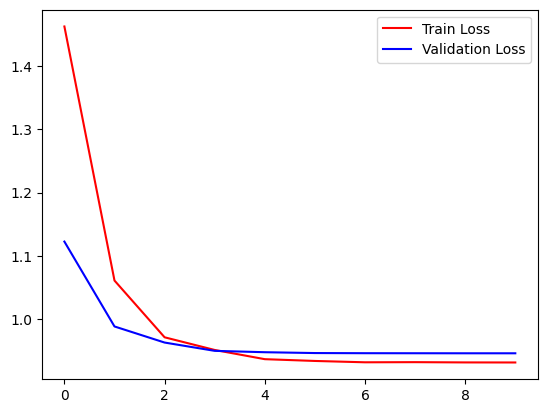

In [43]:
def plot_losses(train_losses,val_losses):

    plt.plot(train_losses,color='r',label = 'Train Loss')
    plt.plot(val_losses, color = 'b', label = 'Validation Loss')
    plt.legend()
    plt.show()
plot_losses(train_losses, val_losses)

#Loading saved model

In [27]:
# Load the checkpoint from the specified path
checkpoint = torch.load(os.path.join('/content/drive/MyDrive/deep_network_development/assignment2/model','best_model.pth'))

# Extract hyperparameters and model state from the checkpoint
embed_dim = checkpoint['embed_dim']  # Embedding size for the captions
vocab_size = len(word2idx)  # Size of the vocabulary
attention_dim = checkpoint['attention_dim']  # Attention layer dimension
encoder_dim = checkpoint['encoder_dim']  # Encoder (ResNet) output dimension
decoder_dim = checkpoint['decoder_dim']  # Decoder hidden state dimension

# Reinitialize the model with the same parameters as the one saved in the checkpoint
loaded_model = Full_model(
    embed_dim=embed_dim,
    vocab_size=vocab_size,
    attention_dim=attention_dim,
    encoder_dim=encoder_dim,
    decoder_dim=decoder_dim
).to(device)  # Move model to the GPU or CPU depending on availability


<ipython-input-27-7c22c32db815>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(os.path.join('/content/drive/MyDrive/deep_network_development/assign

In [28]:
loaded_model.load_state_dict(checkpoint['state_dict'],strict=False)

<All keys matched successfully>

In [29]:
def plot_attention_weights(img, model):
    # Generate caption and attention weights using the model
    caption, attention_weights = generate_caption(img.unsqueeze(dim=0), model)

    # Denormalize the image (convert back to the original range)
    img = denormalize(img)

    # If the image is normalized, scale to [0, 255] for visualization
    if img.max() <= 1.0:
        img = (img * 255).astype(np.uint8)

    # Get the length of the caption
    cap_len = len(word_tokenize(caption))

    # Create a figure to display the image and attention maps
    fig = plt.figure(figsize=(15, 15))

    # Loop through each word in the caption
    for i in range(cap_len):
        # Reshape attention weights to a 4x4 grid for visualization
        att = attention_weights[i].reshape(4, 4)

        # Create subplot for each word in the caption
        ax = fig.add_subplot((cap_len + 1) // 2, 4, i + 1)
        ax.set_title(word_tokenize(caption)[i])  # Display the word as title

        # Show the image in the background
        img_plot = ax.imshow(img)

        # Overlay the attention weights on top of the image
        ax.imshow(att, cmap='gray', alpha=0.7, extent=img_plot.get_extent())

    # Display the final figure
    plt.show()


In [30]:
def generate_caption(img,model,max_len=20,vocab=word2idx):
        model.eval()
        img = img.to(device)
        features = model.encoder(img)
        features = features.to(device)
        batch_size = features.size(0)

        h, c = model.decoder.init_hidden_state(features)  # (batch_size, decoder_dim)
        h,c = h.to(device),c.to(device)
        alphas = []

        #starting input
        word = torch.tensor(word2idx['SOS']).view(1,-1).to(device)

        embeds = model.decoder.embedding(word).to(device)

        captions = []

        for i in range(max_len):

            alpha,context = model.decoder.attention(features, h)

            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())

            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = model.decoder.lstm_cell(lstm_input, (h, c))
            output = model.decoder.fcn(model.decoder.drop(h))
            output = output.view(batch_size,-1)

            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)

            #end if <EOS detected>
            if idx2word[predicted_word_idx.item()] == "EOS":
                break
            captions.append(predicted_word_idx.item())

            #send generated word as the next caption
            embeds = model.decoder.embedding(predicted_word_idx.unsqueeze(0))

        #covert the vocab idx to words and return sentence
        return ' '.join([idx2word[idx] for idx in captions]),alphas

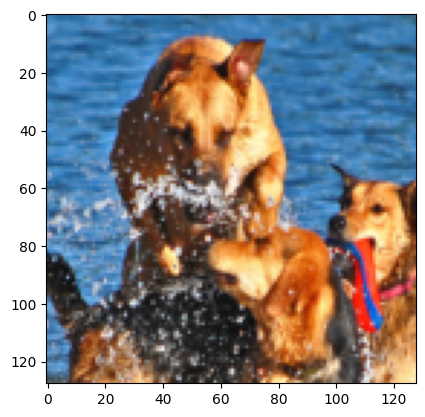

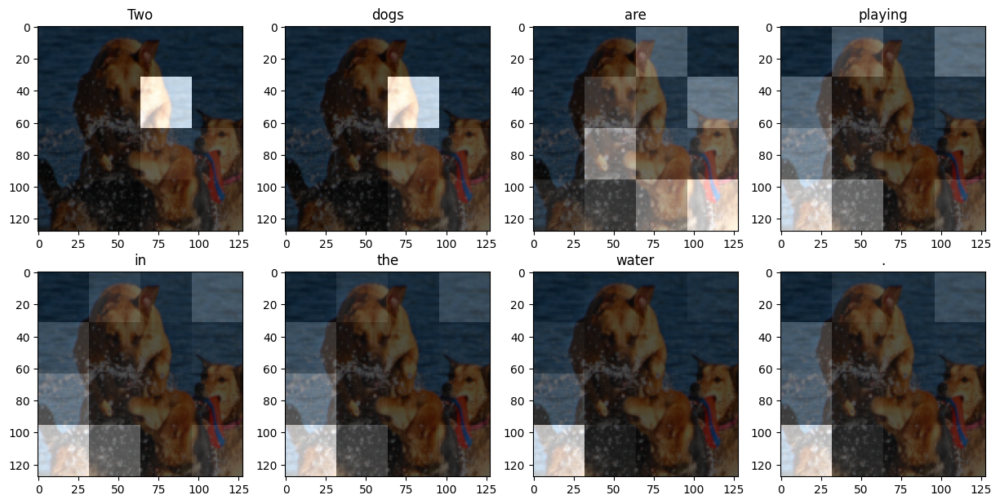

In [31]:
plt.imshow(denormalize(next(iter(test_dataloader))[0][55]))
plot_attention_weights(next(iter(test_dataloader))[0][55],
                       model = loaded_model)

In [53]:
len(next(iter(test_dataloader))[0])

64

In [54]:
img = next(iter(test_dataloader))[0][55].unsqueeze(dim = 0)

In [55]:
caption, alphas = generate_caption(img,loaded_model,max_len=20,vocab=word2idx)

In [56]:
alphas[0]

array([[4.7364042e-04, 2.2552730e-04, 8.9883007e-04, 2.4493717e-04,
        2.4090828e-04, 6.4338418e-03, 7.3609722e-01, 2.5514034e-03,
        3.4792992e-04, 4.1273949e-03, 8.9749120e-02, 6.6745043e-02,
        8.4354082e-04, 4.8270033e-04, 3.0200927e-02, 6.0336974e-02]],
      dtype=float32)

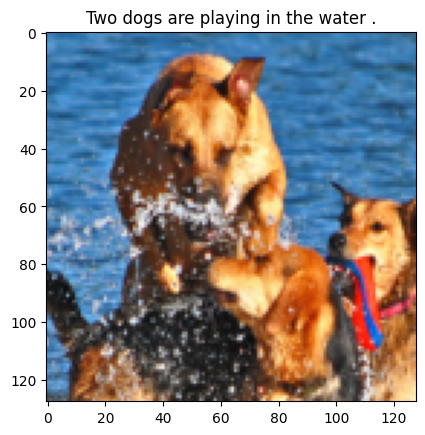

In [57]:
plt.imshow(denormalize(next(iter(test_dataloader))[0][55]))
plt.title(caption)
plt.show()

### 2.3. Evaluation on test set

Evaluate your trained model on the test set. Use the BLEU score as your metric: torchtext.data.metrics.bleu_score(...)

You may try **BLEU-1, 2** and **3**.

In [37]:
def bleu_score(candidate, references, n_gram):
    def get_corpus(sentence, n_gram):
        sentence = sentence.lower()
        corpus = {}
        tokens = word_tokenize(sentence)
        for idx in range(len(tokens) - n_gram + 1):
            n_gram_seq = ' '.join(tokens[idx:idx + n_gram])
            corpus[n_gram_seq] = corpus.get(n_gram_seq, 0) + 1
        return corpus

    precisions = []
    for n in range(1, n_gram + 1):
        candidate_corpus = get_corpus(candidate, n)

        reference_corpus = {}
        for ref in references:
            corpus = get_corpus(ref, n)
            for gram, freq in corpus.items():
                reference_corpus[gram] = max(reference_corpus.get(gram, 0), freq)

        overlap_count = 0
        for gram, cand_count in candidate_corpus.items():
            ref_count = reference_corpus.get(gram, 0)
            overlap_count += min(ref_count, cand_count)

        # Avoid division by zero
        total_candidate_ngrams = sum(candidate_corpus.values())
        if total_candidate_ngrams == 0 or overlap_count == 0:
            precision = 0
        else:
            precision = overlap_count / total_candidate_ngrams

        # Log precision, handle log(0)
        if precision > 0:
            log_precision = np.log(precision) / n
        else:
            log_precision = -float('inf')  # No overlap, log(0)

        precisions.append(log_precision)

    # Geometric mean of precisions (handle -inf case)
    if all(p == -float('inf') for p in precisions):
        exp_precisions = 0  # No overlaps for all n-grams
    else:
        exp_precisions = np.exp(sum(precisions))

    # Brevity penalty
    c = len(word_tokenize(candidate))
    r = min([len(word_tokenize(ref)) for ref in references], key=lambda ref_len: (abs(ref_len - c), ref_len))
    bp = np.exp(1 - r / c) if c < r else 1

    return bp * exp_precisions


In [59]:
def calculate_bleu_score_for_dataloader(dataloader, model, n_gram, number_of_entities):
    # Initialize score accumulator
    score = 0

    # Iterate through each batch of images and captions in the dataloader
    for img, caption in dataloader:
        # Iterate through each image-caption pair
        for i, j in zip(img, caption):
            i = i.unsqueeze(dim=0)  # Add batch dimension to the image tensor

            # Generate caption using the model
            generated_output, _ = generate_caption(i, model)

            # Convert the caption to a human-readable format (join words and remove special tokens)
            references = [' '.join([idx2word[jj.item()] for jj in j if jj not in [0, 1, 2, 3]]).strip()]

            # Calculate BLEU score for the generated caption vs reference
            score += bleu_score(generated_output, references, n_gram)

    # Average the BLEU score across all entities (images)
    score /= number_of_entities
    return score


In [60]:
# Calculate BLEU score for 1-gram (unigrams) on the test dataset
bleu1 = calculate_bleu_score_for_dataloader(test_dataloader, loaded_model, 1, test_size)

# Calculate BLEU score for 2-gram (bigrams) on the test dataset
bleu2 = calculate_bleu_score_for_dataloader(test_dataloader, loaded_model, 2, test_size)

# Calculate BLEU score for 3-gram (trigrams) on the test dataset
bleu3 = calculate_bleu_score_for_dataloader(test_dataloader, loaded_model, 3, test_size)


In [61]:
print(f'bleu1: {bleu1}\nbleu2: {bleu2}\nbleu3: {bleu3}')

bleu1: 0.3259800707677427
bleu2: 0.10436909332719936
bleu3: 0.03576221012654632


### 2.4. Load an existing Image Captioning model
Feel free to choose any pre-trained image captioning model. For simplicity, try choosing a model already trained on Flickr8k.

In [32]:
# ADD YOUR CODE HERE

from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
import torch
from PIL import Image

pre_trained = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pre_trained = pre_trained.to(device)



max_length = 20
num_beams = 4
gen_kwargs = {"max_length": max_length, "num_beams": num_beams}
def predict_step(image_paths):
  images = []
  for image_path in image_paths:
    i_image = Image.open(image_path)
    if i_image.mode != "RGB":
      i_image = i_image.convert(mode="RGB")

    images.append(i_image)

  pixel_values = feature_extractor(images=images, return_tensors="pt").pixel_values
  pixel_values = pixel_values.to(device)

  output_ids = pre_trained.generate(pixel_values, **gen_kwargs)

  preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)
  preds = [pred.strip() for pred in preds]
  return preds


pred = predict_step(['/content/flickr8k/Images/1022454332_6af2c1449a.jpg'])

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.61k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/982M [00:00<?, ?B/s]

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "architectures": [
    "ViTModel"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "qkv_bias": true,
  "transformers_version": "4.46.3"
}

Config of the decoder: <class 'transformers.models.gpt2.modeling_gpt2.GPT2LMHeadModel'> is overwritten by shared decoder config: GPT2Config {
  "activation_function": "gelu_new",
  "add_cross_attention": true,
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "embd_pdrop": 0.1,
  "eos_token_id": 50256,
  "initializer_rang

preprocessor_config.json:   0%|          | 0.00/228 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/241 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/120 [00:00<?, ?B/s]

The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.


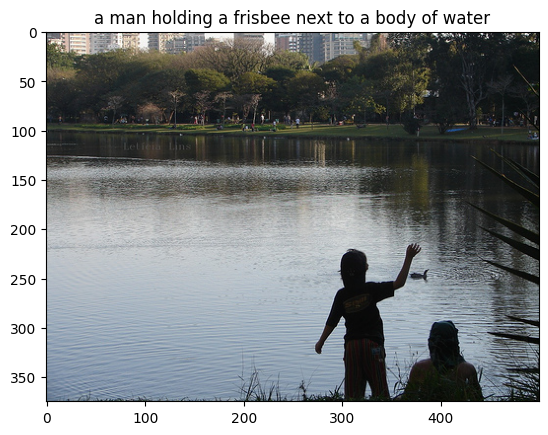

In [33]:
path = '/content/flickr8k/Images/1022454332_6af2c1449a.jpg'
im = cv2.imread(path)
im = cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
plt.title(pred[0])
plt.imshow(im)
plt.show()

### 2.5 Evaluate the chosen pre-trained captioning model on the test set
Use the same metrics chosen on step **2.3**.

In [34]:
import torch
from torchvision import transforms
from PIL import Image

def predict_step_from_dataloader(batch_images,model):

    images = []
    to_pil = transforms.ToPILImage()

    # Convert tensors to PIL images and ensure they're in RGB format
    for img_tensor in batch_images:
        pil_image = to_pil(img_tensor.cpu())  # Convert to PIL
        if pil_image.mode != "RGB":
            pil_image = pil_image.convert("RGB")
        images.append(pil_image)

    # Extract pixel values using the feature extractor
    pixel_values = feature_extractor(images=images, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)

    # Generate predictions
    output_ids = model.generate(pixel_values, **gen_kwargs)
    preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)
    preds = [pred.strip() for pred in preds]

    return preds

In [38]:
def calculate_bleu_score_for_dataloader2(dataloader, model, n_gram, number_of_entities):
    score = 0  # Initialize a variable to accumulate the BLEU score

    # Loop through batches of images and captions in the dataloader
    for img_batch, caption in dataloader:
        # Generate predictions (captions) for the current batch of images
        preds = predict_step_from_dataloader(img_batch, model)

        # Loop through the predictions and the corresponding captions
        for pred, j in zip(preds, caption):
            # Convert the reference caption (ground truth) to text by joining the words
            references = [' '.join([idx2word[jj.item()] for jj in j if jj not in [0, 1, 2, 3]]).strip()]

            # Calculate the BLEU score for the generated caption (pred) and the reference caption (references)
            score += bleu_score(pred, references, n_gram)

    # Average the BLEU score by the number of entities (images)
    score /= number_of_entities

    return score  # Return the final BLEU score


In [39]:
bleu1 = calculate_bleu_score_for_dataloader2(test_dataloader,pre_trained,1,test_size)
bleu2 = calculate_bleu_score_for_dataloader2(test_dataloader,pre_trained,2,test_size)
bleu3 = calculate_bleu_score_for_dataloader2(test_dataloader,pre_trained,3,test_size)

In [40]:
print(f'bleu1: {bleu1}\nbleu2: {bleu2}\nbleu3: {bleu3}')

bleu1: 0.14507323059785862
bleu2: 0.014389137222037175
bleu3: 0.0012438603595317545


# 3. COMPARISON

According to the bleu score the custom model outperformed the pretrained one. However bleu score is not good when it comes to the semnatic similarity of the target and the predicted caption.
